# Analysis on Fragrances and their popularity

***
## Importing and inspection of data
***

In [1]:
import io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px
from wordcloud import WordCloud
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder, StandardScaler 

In [2]:
# Importing the relevant dataset
data = pd.read_csv('Fragrance_Data.csv')

In [3]:
# Looking at the first few rows of the dataset for a quick look
data.head(10)

,Name,Year,Sex,Designer,ParentCompanies,MainAccords1,MainAccords2,MainAccords3,MainAccords4,MainAccords5,...,consumerMainNoteType11,consumerMainNoteType12,consumerMainNoteType13,consumerMainNoteType14,consumerMainNoteType15,consumerMainNoteType16,consumerMainNoteType17,consumerMainNoteType18,consumerMainNoteType19,consumerMainNoteType20
0,Hello Beauty,2019,female,Fabyoulous,NaN,warm spicy,citrus,white floral,fruity,rose,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Hello Gorgeous,2019,female,Fabyoulous,NaN,white floral,soft spicy,woody,sweet,warm spicy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Hello Pretty,2019,female,Fabyoulous,NaN,fruity,floral,sweet,woody,balsamic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,#CrazyGirl,2015,female,#Parfum Hashtag,NaN,fruity,powdery,vanilla,musky,citrus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,#Dream4ever,2016,female,#Parfum Hashtag,NaN,fruity,powdery,vanilla,aromatic,fresh,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,#iloveYou,2015,female,#Parfum Hashtag,NaN,sweet,vanilla,citrus,balsamic,honey,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,#imaPrincess,2014,female,#Parfum Hashtag,NaN,sweet,fruity,patchouli,woody,white floral,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,#PassionAddict,2016,female,#Parfum Hashtag,NaN,fruity,sweet,floral,caramel,vanilla,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,#Rockit,2016,female,#Parfum Hashtag,NaN,powdery,coffee,amber,fruity,white floral,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Hobby Chic,2015,female,10th Avenue Karl Antony,NaN,white floral,sweet,vanilla,coffee,woody,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


>**Let's then take a quick look through the shape and number of null values per column**

In [4]:
data.shape

(23254, 46)

In [5]:
data.isnull().sum()

Name                          0
Year                        223
Sex                           0
Designer                    991
ParentCompanies            8494
MainAccords1               1565
MainAccords2               1619
MainAccords3               1670
MainAccords4               1788
MainAccords5               2030
dayornight                 5799
HaveRating                 3805
HadRating                  5610
WantRating                 1931
SignatureRating           17265
PerfumeRating              3286
Number_Votes               3286
LongevityPoor              3287
LongevityWeak              3287
LongevityModerate          3287
LongevityLong              3287
LongevityVeryLong          3287
SillageSoft                3287
SillageModerate            3287
SillageHeavy               3287
SillageEnormous            3287
consumerMainNoteType1      3023
consumerMainNoteType2      3562
consumerMainNoteType3      4268
consumerMainNoteType4      5792
consumerMainNoteType5      7118
consumer

> **Despite having the number of null values per column, a better way to present the findings will be to convert them to percentage format, which is what I will do next**

In [6]:
# The general flow will include multiplying the number of null values by 100 followed by division of the length of the data
percentage_missing = data.isnull().sum() * 100 / len(data)
missing_data = pd.DataFrame({'percentage_missing': percentage_missing})
missing_data = missing_data.sort_values('percentage_missing')            # sorting the data in ascending order
missing_data

,percentage_missing
Name,0.000000
Sex,0.000000
Year,0.958975
Designer,4.261632
MainAccords1,6.730025
MainAccords2,6.962243
MainAccords3,7.181560
MainAccords4,7.689000
WantRating,8.303948
MainAccords5,8.729681


> **Now we have a good understanding of what are the main features to potentially use and which that we can discard as well. However for now, I shall just keep it first and conduct further data analysis before coming to a conclusion on what to do with columns with a high number of null values.**

***
## Determining the popularity metric (label) 🥅
***

***This section will involve determining the popularity metric (label) for our case study***

> **Like most Data Science projects, the end goal is usually defined to find features which are useful for the label. Although the main objective is to find the features which can predict the popularity of the fragrances, we will first need to define what will our label be!**

>> **The potential columns which can be used as the label includes the following:**
>> - HaveRating
>> - HadRating
>> - WantRating
>> - SignatureRating
>> - PerfumeRating
>> - Number_Votes

In [7]:
deciding_label = data[['HaveRating', 'HadRating', 'WantRating', 'SignatureRating', 'PerfumeRating', 'Number_Votes']]

In [8]:
# Finding the number of null values again to better determine which can be the label
deciding_label.isnull().sum()

HaveRating          3805
HadRating           5610
WantRating          1931
SignatureRating    17265
PerfumeRating       3286
Number_Votes        3286
dtype: int64

> **Besides potentially using the original columns as the label, I decided to conduct feature interactions to see if I could create an even better label**

>> **Therefore, 2 new columns will be created by,**
>> * 'Avg_Rating' by multiplying PerfumeRating and Number_Votes
>> * 'HHWS' for adding the columns HaveRating, HadRating, WantRating and SignatureRating
>> * HHWS is a acronym for Have, Had, Want, Signature 😊😊

In [9]:
# For the addition of the HaveRating, HadRating, WantRating and SignatureRating, most will result in HHWS having a null value
# Therefore, the null values will for each individual columns will first need to be replaed with a 0

data['HaveRating'] = data['HaveRating'].fillna(0)
data['HadRating'] = data['HadRating'].fillna(0)
data['WantRating'] = data['WantRating'].fillna(0)
data['SignatureRating'] = data['SignatureRating'].fillna(0)
data['PerfumeRating'] = data['PerfumeRating'].fillna(0)
data['Number_Votes'] = data['Number_Votes'].fillna(0)

In [10]:
data['Avg_Rating'] = data['PerfumeRating'] * data['Number_Votes']
data['HHWS'] = data['HaveRating'] + data['HadRating'] + data['WantRating'] + data['SignatureRating']

> **To help determine which column is best suited to be the label, I decided to use add the correlation coefficient of every column against each other, including the negative coefficients by changing them to positive first**
> **The reason why I am adding the negative coefficients is because the can also help to predict the label in an inverse way.**

> **Also, I decided to use the method of addition of correlation coefficient as the end goal was to find which label (popularity) could be better predicted.**

>> **Before finding the correlation coefficient, encoding must first be done as well. As several columns have a very high number of unique values or null values, using them will not be very useful in predicting a label.**
>>**Therefore, I will not be including the following columns**
>> * Name
>> * Designer
>> * Parent
>> * ConsumerMainNoteType9 onwards as it has a 60% null valyes

In [11]:
# Creating a copy of the original dataset so as to play around with the labels
data_copy = data.copy()

In [12]:
# Encoding the categorical columns

le = preprocessing.LabelEncoder()

data_copy['Year'] = le.fit_transform(data_copy['Year'].astype(str))
data_copy['ParentCompanies'] = le.fit_transform(data_copy['ParentCompanies'].astype(str))
data_copy['Sex'] = le.fit_transform(data_copy['Sex'])
data_copy['MainAccords1'] = le.fit_transform(data_copy['MainAccords1'].astype(str))
data_copy['MainAccords2'] = le.fit_transform(data_copy['MainAccords2'].astype(str))
data_copy['MainAccords3'] = le.fit_transform(data_copy['MainAccords3'].astype(str))
data_copy['MainAccords4'] = le.fit_transform(data_copy['MainAccords4'].astype(str))
data_copy['MainAccords5'] = le.fit_transform(data_copy['MainAccords5'].astype(str))
data_copy['dayornight'] = le.fit_transform(data_copy['dayornight'].astype(str))
data_copy['consumerMainNoteType1'] = le.fit_transform(data_copy['consumerMainNoteType1'].astype(str))
data_copy['consumerMainNoteType2'] = le.fit_transform(data_copy['consumerMainNoteType2'].astype(str))
data_copy['consumerMainNoteType3'] = le.fit_transform(data_copy['consumerMainNoteType3'].astype(str))
data_copy['consumerMainNoteType4'] = le.fit_transform(data_copy['consumerMainNoteType4'].astype(str))
data_copy['consumerMainNoteType5'] = le.fit_transform(data_copy['consumerMainNoteType5'].astype(str))
data_copy['consumerMainNoteType6'] = le.fit_transform(data_copy['consumerMainNoteType6'].astype(str))
data_copy['consumerMainNoteType7'] = le.fit_transform(data_copy['consumerMainNoteType7'].astype(str))

In [13]:
data_copy.head(20)

,Name,Year,Sex,Designer,ParentCompanies,MainAccords1,MainAccords2,MainAccords3,MainAccords4,MainAccords5,...,consumerMainNoteType13,consumerMainNoteType14,consumerMainNoteType15,consumerMainNoteType16,consumerMainNoteType17,consumerMainNoteType18,consumerMainNoteType19,consumerMainNoteType20,Avg_Rating,HHWS
0,Hello Beauty,128,0,Fabyoulous,38,52,15,70,27,44,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,1.0
1,Hello Gorgeous,128,0,Fabyoulous,38,54,50,73,58,63,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,3.0
2,Hello Pretty,128,0,Fabyoulous,38,21,21,58,72,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,2.0
3,#CrazyGirl,124,0,#Parfum Hashtag,38,21,43,63,40,16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.25,16.0
4,#Dream4ever,125,0,#Parfum Hashtag,38,21,43,63,7,23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.00,5.0
5,#iloveYou,124,0,#Parfum Hashtag,38,45,58,18,9,29,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61.20,23.0
6,#imaPrincess,123,0,#Parfum Hashtag,38,45,24,46,72,66,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.00,12.0
7,#PassionAddict,125,0,#Parfum Hashtag,38,21,53,25,15,60,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.00,5.0
8,#Rockit,125,0,#Parfum Hashtag,38,37,18,4,27,66,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.00,9.0
9,Hobby Chic,124,0,10th Avenue Karl Antony,38,54,53,63,21,69,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.00,5.0


> **Plotting a heatmap of the correlation coefficient will help us to visualise how correlated the features are against each other. However, we will still need a more definite approach (the addition method I proposed earlier) on how to decide which column to use as our feature. Therefore, for this scenario, I will employ the table method instead.**

In [14]:
data_copy.corr()

,Year,Sex,ParentCompanies,MainAccords1,MainAccords2,MainAccords3,MainAccords4,MainAccords5,dayornight,HaveRating,...,SillageEnormous,consumerMainNoteType1,consumerMainNoteType2,consumerMainNoteType3,consumerMainNoteType4,consumerMainNoteType5,consumerMainNoteType6,consumerMainNoteType7,Avg_Rating,HHWS
Year,1.000000,-0.010597,-0.217110,-0.006350,-0.013326,0.000287,0.023004,-0.000650,-0.156531,0.052339,...,0.066692,-0.081007,-0.125396,-0.136706,-0.108940,-0.116923,-0.109351,-0.104267,0.056826,0.059029
Sex,-0.010597,1.000000,0.059171,-0.003944,-0.070391,-0.061794,-0.052945,-0.055531,0.089364,-0.024879,...,0.036167,-0.030340,-0.003163,0.016497,0.005579,0.028506,0.029504,0.043233,-0.036249,-0.029361
ParentCompanies,-0.217110,0.059171,1.000000,0.036547,0.021781,0.005665,-0.002758,0.009272,0.308559,-0.158292,...,-0.118001,0.138189,0.169757,0.155188,0.150813,0.152529,0.150188,0.141902,-0.162497,-0.172486
MainAccords1,-0.006350,-0.003944,0.036547,1.000000,-0.152010,-0.107224,-0.087848,-0.070692,0.097854,0.007761,...,0.041643,0.113528,0.051420,0.046459,0.035028,0.039232,0.025761,0.027105,0.010393,0.010279
MainAccords2,-0.013326,-0.070391,0.021781,-0.152010,1.000000,-0.081232,-0.074161,-0.052041,0.040506,0.005436,...,0.015578,0.065871,0.065802,0.029330,0.025954,0.006010,0.012787,0.004372,0.008174,0.008717
MainAccords3,0.000287,-0.061794,0.005665,-0.107224,-0.081232,1.000000,-0.057362,-0.051446,0.015239,0.001685,...,-0.004071,0.034354,0.038542,0.041773,0.010780,-0.007890,0.004605,-0.001103,0.004599,0.004831
MainAccords4,0.023004,-0.052945,-0.002758,-0.087848,-0.074161,-0.057362,1.000000,-0.045589,0.008720,-0.007091,...,0.006695,0.025799,0.043555,0.042728,0.020267,0.004739,0.002084,-0.001183,-0.004093,-0.003146
MainAccords5,-0.000650,-0.055531,0.009272,-0.070692,-0.052041,-0.051446,-0.045589,1.000000,0.013821,0.011436,...,0.010828,0.013364,0.041122,0.057402,0.036700,0.017794,0.001615,-0.007012,0.013002,0.013528
dayornight,-0.156531,0.089364,0.308559,0.097854,0.040506,0.015239,0.008720,0.013821,1.000000,-0.112642,...,-0.012089,0.241389,0.260311,0.254302,0.233843,0.227409,0.217432,0.209243,-0.116394,-0.123264
HaveRating,0.052339,-0.024879,-0.158292,0.007761,0.005436,0.001685,-0.007091,0.011436,-0.112642,1.000000,...,0.776761,-0.045040,-0.070273,-0.075974,-0.100609,-0.110823,-0.106818,-0.125570,0.986140,0.989553


> **The table below shows the sum of the correlation coefficient for each potential label**

> Column Name | Sum of Correlation Coefficient 
> ---|---
> HaveRating | 14.0963
> HadRating | 12.16743
> WantRating | 13.34019
> SignatureRating | 12.2023
> PerfumeRating | 0.862491
> Number_Votes | 13.63216
> Avg_Rating | 13.75343
> HHWS | 14.13607

> **From the result above, we can then conclude that HHWS will be the best label as it has the largest sum of correlation coefficient.**

---
## Data Analysis 📊
---

>**The data analysis section is split into 2 main parts, with the first being the conventional method of comparing features and columns and the second part using a bag of words model to determine if any words used in the name of the perfume have any influence over the popularity.**

---

### Parent Companies 👪

***This section will involve finding insights regarding the parent companies of fragrances (whether owned by conglomerates).***

>**Parent companies refer to companies that owns enough voting stock in another firm, allowing the parent company to control the management and operation by influencing or electing the smaller company's board of directors.**

>**While my script was scraping data, I realised that most of the time spent were scraping were on a specific few parent companies. Therefore, I wanted to know if such companies have more popular fragrances as such conglomerates have more reach by selling their products in more parts of the world along with spendming more money for advertisements.**

>**To do so, I only filled in parent companies for brands who are owned by bigger conglomerates.**

In [15]:
fig = px.pie(data, names = 'ParentCompanies',
             height = 800,
             title = 'Ratio of Fragrances with and without Parent Companies')
fig.update_traces(textposition='inside')
fig.show()

>**Just to give a quick look into the numbers, 1% in this scenario is approximately 232 fragrances!!!**

>**It can be seen that it is true that conglomerates do own most of the fragrance market (up to 63.5%). However, from the correlation table created earlier, it can be seen that the parentcompany column only has a correlation coefficient of -0.17249 with the HHWS column as well.**

>**Let's then take a look at how many of the top fragrances come from the conglomerates as well**

In [16]:
pc = data.sort_values(['HHWS'], ascending=[False])
pc = pc.head(100)
pc['ParentCompanies'].value_counts()

L'Oreal               22
LVMH                  17
Coty                  11
Chanel                11
Shiseido               7
Euroitalia SRL         6
Puig                   4
Estee Lauder           4
Revlon                 2
Inter Parfums          2
AmorePacific Group     2
Selectiva SpA          1
Lalique Group SA       1
Name: ParentCompanies, dtype: int64

>**Taking the top 100 fragrances with refernce to the label (HHWS), 90% of the top fragrances are owned by the conglomerates.**

>**Therefore, it can be concluded that despite parent companies having a much variety of products, most of their products are not very popular.**

### Release Year and Popularity 🕒😍

***This section will include visualising the popularity metric (HHWS) and number of votes of the fragrances through the years, starting all the way from 1792 to 2020.***

>**Do you know that one of the oldest fragrances still available on the market debuted in the 18th century?**

>**It is a perfume called Original Eau De Cologne by 4711. Due to its immense popularity, they even have a 800ml bottle of the perfume available! You can find out more about the perfume [here](https://www.fragrantica.com/perfume/4711/4711-Original-Eau-de-Cologne-3256.html)**

>**I personally find the fact that a fragrance which came out more than 200 years ago still being sold today find amazing and I definitely can't wait to try it one day as well!**

>**As more people had the financial power to buy perfumes along with more perfume designers entering the market in the recent years, I wanted to visualise the popularity of the perfumes against the number of votes across the years they were released as well.**

In [17]:
# Converting the Year column into integer form so as to visualise it
data['Year'] = data['Year'].replace([' '], np.nan)
data['Year'] = data['Year'].fillna(0)
data['Year'].astype(int)
data['Year'] = pd.to_numeric(data['Year'])

In [18]:
data['Year'].unique()

array([2019, 2015, 2016, 2014,    0, 2011, 2012, 2000, 1990, 2009, 2010,
       2013, 2017, 1935, 2018, 2020, 2008, 1792, 2006, 2002, 1997, 2007,
       2004, 1853, 1916, 2003, 1930, 2005, 1999, 2001, 1994, 1992, 1998,
       1993, 1995, 1987, 1991, 1980, 1979, 1996, 1981, 1972, 1955, 1978,
       1984, 1934, 1986, 1989, 1969, 1985, 1976, 1983, 1982, 1968, 1940,
       1975, 1973, 1988, 1966, 1977, 1906, 1910, 1878, 1974, 1860, 1942,
       1954, 1967, 1957, 1971, 1970, 1965, 1963, 1956, 1964, 1961, 1938,
       1950, 1959, 1945, 1962, 1949, 1947, 1932, 1936, 1928, 1944, 1924,
       1939, 1923, 1927, 1952, 1911, 1922, 1919, 1913, 1946, 1958, 1931,
       1921, 1926, 1925, 1920, 1948, 1872, 1917, 1907, 1905, 1941, 1953,
       1912, 1894, 1929, 1908, 1909, 1890, 1880, 1904, 1933, 1901, 1937,
       1889, 1960, 1899, 1882, 1896, 1918, 1902, 1870, 1806], dtype=int64)

In [19]:
# Sorting the dataframe by year to display it in the graph properly as it has a animation frame
ascending_year = data.sort_values('Year', ascending = False)

# Creating a new column to indicate if the fragrance is owned by a conglomerate
ascending_year['PC'] = ascending_year['ParentCompanies'].apply(lambda x: 'Owned by' if not pd.isnull(x) else 'Not owned by').astype(str)


In [20]:
fig = px.scatter(ascending_year, x = 'Number_Votes', y = 'HHWS',
                 log_x = True, color = 'PC',
                 animation_frame = 'Year', hover_name = "Name")

fig.show()

>**From the scatter plot above, we can see that in the recent years, the number of fragrances released per year is increasing**

>**Also, as concluded earlier, we can also see that the upper echolon of popularity is mainly occupied by fragrances owned by conglomerates.**

### Parent Companies, Year and Popularity Correlation 👪🕒😍

***This section will involve checking my 2 hypoethesis and visualising the scatter plot earlier without taking the year the fragrance was released into account. This will allow us to see if the year the fragrance was released directly influences the popularity as well.***

>**So far, we are able to see that fragrances with larger parent companies tend to have a higher chance of becoming more popular compared to fragrances without one. My hypothesis will be that such fragrances can be heavily promoted as the the companies will have a wider reach with more marketing spending.**

>**However, I was also wondering if the year the fragrance was released will affect the popularity as well. One reason I thought of this was because products take time to build up in popularity and fragrances are changed rather infrequently as well.**

>**Therefore, I believe that before a fragrance product reaches the upper echolon of popularity, it will take about 10-20 years. Let's find out more!**

In [21]:
ascending_year2 = ascending_year.copy()

In [22]:
ascending_year2.loc[ascending_year2['ParentCompanies'].notnull(), 'ParentCompanies'] = 'Conglomerate'
ascending_year2.loc[ascending_year2['ParentCompanies'].isnull(), 'ParentCompanies'] = 'Smaller Companies'

In [23]:
# Taking out products which does not have a specified year for better visualisation purposes
ascending_year2 = ascending_year2[ascending_year2.Year != 0]

In [24]:
fig = px.scatter(ascending_year2, x = 'Year', y = 'HHWS', 
                 color = 'ParentCompanies', size = 'Number_Votes',
                 hover_data = ['Designer', 'Name', 'Year', 'Sex', 'HHWS'])

fig.show()

>**To have a better view of whether my hypothesis is correct, you may also zoom in on the scatter plot above to the period betwee 1980 to 2010.**

>**From this new scatter plot, we can also see that my second hypothesis is true as the most popular fragrances are released at least 10 years ago, with majority released before 2010.**

>**This can be attributed to people who were in their 20s at that period of time (1990 - 2010) having much more financial spending power now, allowing them to try and purchase the products.**

### Accords 🌹🍊

***This section will include visualising the different types of accords and notes in fragrances and how popular they are across all the fragrances, without reference to the popularity metric (HHWS).***

>**In perfume, an accord is a scent made up of several notes, or ingredients, coming together to form a distinct fragrance.**

>>**NOTE: For this dataset, the accords are primarily determined by the people who has smelled the perfume before and voicing their take on the type of notes in the perfume.**

>**An accord is more specific compared to the note as well. For example, an accord from perfume A can be referring to Lemon, Chamomile and 'Forget Me Not' (Yes that is the name of a flower). Therefore, notes wise, as lemons falls into Citrus and the remaining 2 from Flowers, we can say that perfume A has accords of Citrus and Flowers as it is more general and less infomative.**

In [25]:
accords = data.copy()

In [26]:
print('Number of unique accords under Accord 1:', accords['MainAccords1'].nunique())
print('Number of unique accords under Accord 2:', accords['MainAccords2'].nunique())
print('Number of unique accords under Accord 3:', accords['MainAccords3'].nunique())
print('Number of unique accords under Accord 4:', accords['MainAccords4'].nunique())
print('Number of unique accords under Accord 5:', accords['MainAccords5'].nunique())

Number of unique accords under Accord 1: 57
Number of unique accords under Accord 2: 66
Number of unique accords under Accord 3: 74
Number of unique accords under Accord 4: 73
Number of unique accords under Accord 5: 70


In [27]:
# Merging the respective columns into an array to make it easier to find unique strings
column_accords = accords[['MainAccords1', 'MainAccords2', 'MainAccords3', 'MainAccords4', 'MainAccords5']].values.ravel()
unique_accords =  pd.unique(column_accords)
len(unique_accords)

83

In [28]:
column_accords = [x for x in column_accords if str(x) != 'nan']

In [29]:
# Creating a dictionary to calculate the number of times each accord appears
freq = {}

for i in column_accords:
    if i in freq:
        freq[i] += 1
    else:
        freq[i] = 1

In [30]:
# Then, creating a dataframe from the dictionary to to better visualise it
freq = pd.DataFrame(freq.items(), columns = ['Types', 'Frequency'])
freq['Accord'] = 'Accord'
freq

,Types,Frequency,Accord
0,warm spicy,4587,Accord
1,citrus,8758,Accord
2,white floral,4829,Accord
3,fruity,6149,Accord
4,rose,2903,Accord
...,...,...,...
77,plastic,2,Accord
78,caramela,3,Accord
79,anis,1,Accord
80,white wine,2,Accord


In [31]:
fig = px.treemap(freq, path=['Accord', 'Types'], values='Frequency')
fig.show()

>**We can see that woody smells are the most commonly found across all fragrances. However, this does not mean that woody smell is the most popular as this treemap is based on how many times it has appeared, meaning to say, without reference to the popularity metric (HHWS).**

>**However, as there are still 83 unique accords across all 5 columns, it is still too many to be shown visually. Therefore, I will be classifying those accords into their respective notes. You may find out more about how I group them [here](https://www.fragrantica.com/notes/).**

>>**The aforementioned notes include:**

Column Name | Description of Column
---|---
Citrus | Citrus
Fruits_Veg_Nuts | Fruits, Vegetables and Nuts
Flowers | Flowers
W_Flowers | White Flowers
Herbs_Fougeres | Greens, Herbs and Fougeres
Spices | Spices
Sweet_Gourmand | Sweets and Gourmand Smells
Wood_Mosses | Woods and Mosses
Resins_Balsams | Resins and Balsams
Musk_Amber_Animalic | Musk, Amber, Animalic Smells
Beverages | Beverages
Synthetic_Weird | Natural and Sythetic, Popular and Weird

In [32]:
# Importing in another csv which contains information about how I grouped the accords mentioned earlier. 
notes = pd.read_csv('Perfume_Notes.csv')

In [33]:
notes.columns

Index(['Citrus', 'Fruits_Veg_Nuts', 'Flowers', 'W_Flowers', 'Herbs_Fougeres',
       'Spices', 'Sweet_Gourmand', 'Wood_Mosses', 'Resins_Balsams',
       'Musk_Amber_Animalic', 'Beverages', 'Synthetic_Weird'],
      dtype='object')

In [34]:
# Dropping all NA values along with converting the columns into list for easier cross checking later
citrus = notes['Citrus'].dropna().tolist()
fruits_veg_nuts = notes['Fruits_Veg_Nuts'].dropna().tolist()
flowers = notes['Flowers'].dropna().tolist()
w_flowers = notes['W_Flowers'].dropna().tolist()
herbs_fougeres = notes['Herbs_Fougeres'].dropna().tolist()
spices = notes['Spices'].dropna().tolist()
sweet_gourmand = notes['Sweet_Gourmand'].dropna().tolist()
wood_mosses = notes['Wood_Mosses'].dropna().tolist()
resins_balsams = notes['Resins_Balsams'].dropna().tolist()
musk_amber_animalic = notes['Musk_Amber_Animalic'].dropna().tolist()
beverages = notes['Beverages'].dropna().tolist()
synthetic_weird = notes['Synthetic_Weird'].dropna().tolist()

In [35]:
# Converting the columns from the original dataframe into a list to directly compare with the lists created one cell earlier
accord1 = accords['consumerMainNoteType1'].tolist()
accord2 = accords['consumerMainNoteType2'].tolist()
accord3 = accords['consumerMainNoteType3'].tolist()
accord4 = accords['consumerMainNoteType4'].tolist()
accord5 = accords['consumerMainNoteType5'].tolist()
accord6 = accords['consumerMainNoteType6'].tolist()
accord7 = accords['consumerMainNoteType7'].tolist()
accord8 = accords['consumerMainNoteType8'].tolist()

# Then, merging all the list together
allaccords = accord1 + accord2 + accord3 + accord4 + accord5 + accord6 + accord7 + accord8
len(allaccords)

186032

In [36]:
# This cell will include include cross checking which note appeared.
# This is done by counting the frequency by cross checking the 2 lists created earlier.
# The results are then shown in a table in the next cell.

citrus_number = 0
fruits_veg_nuts_number = 0
flowers_number = 0
w_flowers_number = 0
herbs_fougeres_number = 0
spices_number = 0
sweet_gourmand_number = 0
wood_mosses_number = 0
resins_balsams_number = 0
musk_amber_animalic_number = 0
beverages_number = 0
synthetic_weird_number = 0

for i in allaccords:
    if i in citrus:
        citrus_number += 1
print('Number of citrus notes: ', citrus_number)

for i in allaccords:
    if i in fruits_veg_nuts:
        fruits_veg_nuts_number += 1
print('Number of fruits, vegetable and nut notes: ', fruits_veg_nuts_number)

for i in allaccords:
    if i in flowers:
        flowers_number += 1
print('Number of flower notes: ', flowers_number)

for i in allaccords:
    if i in w_flowers:
        w_flowers_number += 1
print('Number of white flower notes: ', w_flowers_number)

for i in allaccords:
    if i in herbs_fougeres:
        herbs_fougeres_number += 1
print('Number of herbs and fougeres notes: ', herbs_fougeres_number)

for i in allaccords:
    if i in spices:
        spices_number += 1
print('Number of spices notes: ', spices_number)

for i in allaccords:
    if i in sweet_gourmand:
        sweet_gourmand_number += 1
print('Number of sweet gourmand notes: ', sweet_gourmand_number)

for i in allaccords:
    if i in wood_mosses:
        wood_mosses_number += 1
print('Number of wood and mosses notes: ', wood_mosses_number)

for i in allaccords:
    if i in resins_balsams:
        resins_balsams_number += 1
print('Number of resins and balsams notes: ', resins_balsams_number)

for i in allaccords:
    if i in musk_amber_animalic:
        musk_amber_animalic_number += 1
print('Number of must, amber and animalic notes: ', musk_amber_animalic_number)

for i in allaccords:
    if i in beverages:
        beverages_number += 1
print('Number of beverages notes: ', beverages_number)

for i in allaccords:
    if i in synthetic_weird:
        synthetic_weird_number += 1
print('Number of synthetic and weird notes: ', synthetic_weird_number)

Number of citrus notes:  14781
Number of fruits, vegetable and nut notes:  12141
Number of flower notes:  19812
Number of white flower notes:  9153
Number of herbs and fougeres notes:  6544
Number of spices notes:  14188
Number of sweet gourmand notes:  1861
Number of wood and mosses notes:  17107
Number of resins and balsams notes:  2561
Number of must, amber and animalic notes:  12595
Number of beverages notes:  579
Number of synthetic and weird notes:  1381


Note | Frequency of Notes
---|---
Flowers | 19812
Woods and Mosses | 17107
Citrus | 14781
Spices | 14188
Musk, Amber, Animalic Smells | 12595
Fruits, Vegetables and Nuts | 12141
White Flowers | 9153
Greens, Herbs and Fougeres | 6544
Resins and Balsams | 2561
Sweets and Gourmand Smells | 1861
Natural and Sythetic, Popular and Weird | 1381
Beverages | 579

>**However, as this is only in a table format and showing the frequency of each note, I wanted a better visualisation of how often the different accords and notes appeared.**

In [37]:
# Taking the dictionary approach to count the number of times each accord appears.
# Compared to earlier, this approach will allow me to also count the frequency each accord appears.
citrus_freq = {}
fruits_veg_nuts_freq = {}
flowers_freq = {}
w_flowers_freq = {}
herbs_fougeres_freq = {}
spices_freq = {}
sweet_gourmand_freq = {}
wood_mosses_freq = {}
resins_balsams_freq = {}
musk_amber_animalic_freq = {}
beverages_freq = {}
synthetic_weird_freq = {}

for i in allaccords:
    if (i in citrus_freq and i in citrus):
        citrus_freq[i] += 1
    elif (i not in citrus_freq and i in citrus):
        citrus_freq[i] = 1
        
for i in allaccords:
    if (i in fruits_veg_nuts_freq and i in fruits_veg_nuts):
        fruits_veg_nuts_freq[i] += 1
    elif (i not in fruits_veg_nuts_freq and i in fruits_veg_nuts):
        fruits_veg_nuts_freq[i] = 1
        
for i in allaccords:
    if (i in flowers_freq and i in flowers):
        flowers_freq[i] += 1
    elif (i not in flowers_freq and i in flowers):
        flowers_freq[i] = 1
        
for i in allaccords:
    if (i in w_flowers_freq and i in w_flowers):
        w_flowers_freq[i] += 1
    elif (i not in w_flowers_freq and i in w_flowers):
        w_flowers_freq[i] = 1
        
for i in allaccords:
    if (i in herbs_fougeres_freq and i in herbs_fougeres):
        herbs_fougeres_freq[i] += 1
    elif (i not in herbs_fougeres_freq and i in herbs_fougeres):
        herbs_fougeres_freq[i] = 1
        
for i in allaccords:
    if (i in spices_freq and i in spices):
        spices_freq[i] += 1
    elif (i not in spices_freq and i in spices):
        spices_freq[i] = 1
        
for i in allaccords:
    if (i in sweet_gourmand_freq and i in sweet_gourmand):
        sweet_gourmand_freq[i] += 1
    elif (i not in sweet_gourmand_freq and i in sweet_gourmand):
        sweet_gourmand_freq[i] = 1
        
for i in allaccords:
    if (i in wood_mosses_freq and i in wood_mosses):
        wood_mosses_freq[i] += 1
    elif (i not in wood_mosses_freq and i in wood_mosses):
        wood_mosses_freq[i] = 1
        
for i in allaccords:
    if (i in resins_balsams_freq and i in resins_balsams ):
        resins_balsams_freq[i] += 1
    elif (i not in resins_balsams_freq and i in resins_balsams):
        resins_balsams_freq[i] = 1
        
for i in allaccords:
    if (i in musk_amber_animalic_freq and i in musk_amber_animalic):
        musk_amber_animalic_freq[i] += 1
    elif (i not in musk_amber_animalic_freq and i in musk_amber_animalic):
        musk_amber_animalic_freq[i] = 1
        
for i in allaccords:
    if (i in beverages_freq and i in beverages):
        beverages_freq[i] += 1
    elif (i not in beverages_freq and i in beverages):
        beverages_freq[i] = 1
        
for i in allaccords:
    if (i in synthetic_weird_freq and i in synthetic_weird):
        synthetic_weird_freq[i] += 1
    elif (i not in synthetic_weird_freq and i in synthetic_weird):
        synthetic_weird_freq[i] = 1

In [38]:
# Merging all the dictionaries together
all_freq = {**citrus_freq, **fruits_veg_nuts_freq, **flowers_freq, **w_flowers_freq, **herbs_fougeres_freq, 
            **spices_freq, **sweet_gourmand_freq, **wood_mosses_freq, **resins_balsams_freq, **musk_amber_animalic_freq, 
            **beverages_freq, **synthetic_weird_freq}

In [39]:
len(all_freq)

625

In [40]:
# Creating a dataframe so as to create a sunburst map more easily
freq = pd.DataFrame(all_freq.items(), columns = ['Smell', 'Frequency'])
freq['Notes'] = ''
freq['Fragrance'] = 'Types of Notes and Accords'
freq.iloc[0:26, 2] = 'Citrus'
freq.iloc[26:122, 2] = 'Fruits, Vegetables and Nuts'
freq.iloc[122:245, 2] = 'Flowers'
freq.iloc[245:261, 2] = 'White Flowers'
freq.iloc[261:339, 2] = 'Greens, Herbs and Fougeres'
freq.iloc[339:383, 2] = 'Spices'
freq.iloc[383:424, 2] = 'Sweets and Gourmand Smells'
freq.iloc[424:481, 2] = 'Woods and Mosses'
freq.iloc[481:501, 2] = 'Resins and Balsams'
freq.iloc[501:530, 2] = 'Musk, Amber, Animalic Smells'
freq.iloc[530:566, 2] = 'Beverages'
freq.iloc[566:627, 2] = 'Natural and Sythetic, Popular and Weird'
freq

,Smell,Frequency,Notes,Fragrance
0,Neroli,823,Citrus,Types of Notes and Accords
1,Mandarin Orange,2436,Citrus,Types of Notes and Accords
2,Lemon,1569,Citrus,Types of Notes and Accords
3,Orange,908,Citrus,Types of Notes and Accords
4,Petitgrain,320,Citrus,Types of Notes and Accords
...,...,...,...,...
620,Coal,1,"Natural and Sythetic, Popular and Weird",Types of Notes and Accords
621,Fire,1,"Natural and Sythetic, Popular and Weird",Types of Notes and Accords
622,Galaxolide,1,"Natural and Sythetic, Popular and Weird",Types of Notes and Accords
623,Ash,2,"Natural and Sythetic, Popular and Weird",Types of Notes and Accords


In [41]:
fig = px.treemap(freq, path=['Fragrance', 'Notes', 'Smell'], values='Frequency')
fig.show()

>**The newly created treemap now show much more details regarding the types of notes out there along with the accords that fall in line with the notes they are under and their respective frequency.**

>**However, again, this map does not take into account the popularity of each note or accord, which is what we shall do next.**

In [42]:
accord_popularity = data[['consumerMainNoteType1', 'consumerMainNoteType2', 'consumerMainNoteType3', 'consumerMainNoteType4',
                         'consumerMainNoteType5', 'consumerMainNoteType6', 'consumerMainNoteType7', 'consumerMainNoteType8',
                         'HHWS']].copy()
# Picking out the most popular accord across the multiple columns of accords
accord_popularity['highest_accord'] = ''
accord_popularity

,consumerMainNoteType1,consumerMainNoteType2,consumerMainNoteType3,consumerMainNoteType4,consumerMainNoteType5,consumerMainNoteType6,consumerMainNoteType7,consumerMainNoteType8,HHWS,highest_accord
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,
3,Blueberry,Vanilla,Black Currant,Musk,Bergamot,Violet,NaN,NaN,16.0,
4,Vanilla,Blueberry,Violet,Cassis,Musk,Bergamot,NaN,NaN,5.0,
...,...,...,...,...,...,...,...,...,...,...
23249,Woody Notes,Lavender,Leather,Citruses,NaN,NaN,NaN,NaN,2.0,
23250,Lemon,Mandarin Orange,Musk,Amber,NaN,NaN,NaN,NaN,6.0,
23251,Mandarin Orange,Bergamot,Floral Notes,Musk,NaN,NaN,NaN,NaN,2.0,
23252,Bamboo Leaf,Sea Notes,Italian Mandarin,NaN,NaN,NaN,NaN,NaN,3.0,


In [43]:
# Creating a dictionary to count the frequency of notes later
checkdict = {'Citrus':0, 'Fruits_veg_nuts':0, 'Flowers':0, 'W_flowers':0, 'Herbs_fougeres':0, 
             'Spices':0, 'Sweet_gourmand':0, 'Wood_mosses':0, 'Resins_balsams':0, 'Musk_amber_animalic':0, 
             'Beverages':0, 'Synthetic_weird':0}

# Then, going through the entire dataframe to count the frequency of notes
for i, row in accord_popularity.iterrows():
    checkdict = checkdict.fromkeys(checkdict, 0)
    for a in row:
        if a in citrus:
            checkdict['Citrus'] += 1
    for b in row:
        if b in fruits_veg_nuts:
            checkdict['Fruits_veg_nuts'] += 1
    for c in row:
        if c in flowers:
            checkdict['Flowers'] += 1
    for d in row:
        if d in w_flowers:
            checkdict['W_flowers'] += 1
    for e in row:
        if e in herbs_fougeres:
            checkdict['Herbs_fougeres'] += 1
    for f in row:
        if f in spices:
            checkdict['Spices'] += 1
    for g in row:
        if g in sweet_gourmand:
            checkdict['Sweet_gourmand'] += 1
    for h in row:
        if h in wood_mosses:
            checkdict['Wood_mosses'] += 1
    for k in row:
        if k in resins_balsams:
            checkdict['Resins_balsams'] += 1
    for l in row:
        if l in musk_amber_animalic:
            checkdict['Musk_amber_animalic'] += 1
    for m in row:
        if m in beverages:
            checkdict['Beverages'] += 1
    for n in row:
        if n in synthetic_weird:
            checkdict['Synthetic_weird'] += 1
    
    # If there is no conclusion reached from the loop, 'None' will be entered
    if (all(x == 0 for x in checkdict.values()) == False):
        accord_popularity.loc[i, 'highest_accord'] = max(checkdict, key = checkdict.get)
    else:
        accord_popularity.loc[i, 'highest_accord'] = 'None'

In [44]:
# Removing fragrances without any maximum frequency of notes
accord_popularity = accord_popularity[~accord_popularity.highest_accord.str.contains('None')]

In [45]:
fig = px.box(accord_popularity, x = 'highest_accord', y = 'HHWS', log_y = True)
fig.show()

>**Hover over the respective boxplots to find out more about detaisl such as the min, max and median!**

>**As the range of HHWS is very wide, it can be an issue to visually compare the results of HHWS against the most popular notes, therefore I set log_y to be True.**

### Longevity and Silage 💨💥

***This section will showcase and visualise the number of times each power of the longevity and silage appears.***

In [46]:
longevity = data.copy()

In [47]:
# L_Rep = Longevity Representation
longevity['L_Rep'] = longevity[['LongevityPoor', 'LongevityWeak', 'LongevityModerate', 'LongevityLong', 'LongevityVeryLong']].idxmax(axis=1)
longevity

,Name,Year,Sex,Designer,ParentCompanies,MainAccords1,MainAccords2,MainAccords3,MainAccords4,MainAccords5,...,consumerMainNoteType14,consumerMainNoteType15,consumerMainNoteType16,consumerMainNoteType17,consumerMainNoteType18,consumerMainNoteType19,consumerMainNoteType20,Avg_Rating,HHWS,L_Rep
0,Hello Beauty,2019,female,Fabyoulous,NaN,warm spicy,citrus,white floral,fruity,rose,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,1.0,NaN
1,Hello Gorgeous,2019,female,Fabyoulous,NaN,white floral,soft spicy,woody,sweet,warm spicy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,3.0,NaN
2,Hello Pretty,2019,female,Fabyoulous,NaN,fruity,floral,sweet,woody,balsamic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,2.0,NaN
3,#CrazyGirl,2015,female,#Parfum Hashtag,NaN,fruity,powdery,vanilla,musky,citrus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.25,16.0,LongevityModerate
4,#Dream4ever,2016,female,#Parfum Hashtag,NaN,fruity,powdery,vanilla,aromatic,fresh,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.00,5.0,LongevityPoor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23249,Victorius,0,male,Ãsika,NaN,woody,aromatic,leather,citrus,fresh spicy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.00,2.0,LongevityLong
23250,You,0,unisex,Ãsika,NaN,citrus,musky,amber,powdery,aromatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.65,6.0,LongevityLong
23251,You Emotion,0,female,Ãsika,NaN,citrus,floral,fresh spicy,musky,powdery,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.00,2.0,LongevityModerate
23252,You Live,2012,unisex,Ãsika,NaN,woody,marine,citrus,aromatic,salty,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,3.0,LongevityModerate


In [48]:
fig = px.histogram(longevity, x = 'L_Rep', color = 'Sex', 
                   category_orders = {'L_Rep': ['LongevityPoor', 'LongevityWeak', 'LongevityModerate',
                   'LongevityLong', 'LongevityVeryLong']})
fig.show()

>**As shown by the histogram above, it seems that most fragrances out in the market only have a moderate longevity. However, it should also be noted that fragnraces rarely last very long as well. Even if they do, such fragrances are usually extremely expensive, examples include a 17.5ml version costing USD 198 and a 100ml version costing USD 590. Reviews have even mentioned that the fragrance still linger despite doing laundry as well.**

In [49]:
silage = data.copy()

In [50]:
# S_Rep = Silage Representation
silage['S_Rep'] = longevity[['SillageSoft', 'SillageModerate', 'SillageHeavy', 'SillageEnormous']].idxmax(axis=1)
silage

,Name,Year,Sex,Designer,ParentCompanies,MainAccords1,MainAccords2,MainAccords3,MainAccords4,MainAccords5,...,consumerMainNoteType14,consumerMainNoteType15,consumerMainNoteType16,consumerMainNoteType17,consumerMainNoteType18,consumerMainNoteType19,consumerMainNoteType20,Avg_Rating,HHWS,S_Rep
0,Hello Beauty,2019,female,Fabyoulous,NaN,warm spicy,citrus,white floral,fruity,rose,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,1.0,NaN
1,Hello Gorgeous,2019,female,Fabyoulous,NaN,white floral,soft spicy,woody,sweet,warm spicy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,3.0,NaN
2,Hello Pretty,2019,female,Fabyoulous,NaN,fruity,floral,sweet,woody,balsamic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,2.0,NaN
3,#CrazyGirl,2015,female,#Parfum Hashtag,NaN,fruity,powdery,vanilla,musky,citrus,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.25,16.0,SillageModerate
4,#Dream4ever,2016,female,#Parfum Hashtag,NaN,fruity,powdery,vanilla,aromatic,fresh,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.00,5.0,SillageModerate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23249,Victorius,0,male,Ãsika,NaN,woody,aromatic,leather,citrus,fresh spicy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.00,2.0,SillageModerate
23250,You,0,unisex,Ãsika,NaN,citrus,musky,amber,powdery,aromatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.65,6.0,SillageModerate
23251,You Emotion,0,female,Ãsika,NaN,citrus,floral,fresh spicy,musky,powdery,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.00,2.0,SillageModerate
23252,You Live,2012,unisex,Ãsika,NaN,woody,marine,citrus,aromatic,salty,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,3.0,SillageSoft


In [51]:
fig = px.histogram(silage, x = 'S_Rep', color = 'Sex',
                   category_orders = {'S_Rep': ['SillageSoft', 'SillageModerate', 'SillageHeavy',
                   'SillageEnormous']})
fig.show()

>**Similar to the longevity histogram, most fragrances only have a moderate power as those with a powerful silage are usually much more costly as well**

### Day or Night? 🌅🌙

***This section will showcase and compare if a day time or night time fragrance is associated with the longevity and silage.***

>**The difference between day time and night time fragrance is how light they are. For example, a day time fragrance is usually more fresh and lighter. Imagine a flowery or citrusy kind of fragrance.**

>>**Such day time fragrances are usually worn during the day time as the temperature and humidity is usually higher during day time. Therefore, it is a more formal fragrance (can be worn to office) and less likely to offend people as well**

>**Night time fragrances are usually much heavier and powerful. Imagine a heavy vanilla or musky type of fragrance.**

>>**Besides the temperature and humidity being lower in the night, night time fragrances are also perceived to be much more sexy and attractive but also likely to offend people as well.**

In [52]:
daynight = data.copy()

In [53]:
fig = px.pie(daynight, names = 'dayornight',
             height = 800,
             title = 'Percentage of day and night fragrances')
fig.show()

>**We can see that there is a much higher number of day time fragrances comapared to the others. This might be attributed to the fact that people tending to wear day time fragrances more often and thus, require replenishing more often, leading to a higher demand and companies looking to profit from it.**

In [54]:
daynight['L_Rep'] = daynight[['LongevityPoor', 'LongevityWeak', 'LongevityModerate', 'LongevityLong', 'LongevityVeryLong']].idxmax(axis=1)
daynight['S_Rep'] = daynight[['SillageSoft', 'SillageModerate', 'SillageHeavy', 'SillageEnormous']].idxmax(axis=1)
daynight['dayornight'] = daynight['dayornight'].fillna('NA')
daynight['L_Rep'] = daynight['L_Rep'].fillna('NA')
daynight['S_Rep'] = daynight['S_Rep'].fillna('NA')

In [55]:
fig = px.sunburst(daynight, path = ['dayornight', 'L_Rep'])
fig.show()

>**These sunburst charts are interactive! Click on the respective sections and they will expand accordingly to show more about the respective longevity or silage powers.**

In [56]:
fig = px.sunburst(daynight, path = ['dayornight', 'S_Rep'])
fig.show()

>****The above sunburst charts shows the proportion of of silage under the day time and night time fragrances. As we can see, night time scents tend to have a much more powerful longevity and silage as well. However as much as it is nice to find a fragrance with powerful silage, it can be offensive to others and deemed as informal as well.**

## Bag of Words Approach 👜

>**I decided to take on a natural language approach as well as fragrances are designer products with many biases out there. Therefore, I will like to find out if the types of word used affects the popularity of fragrances as well.**

In [57]:
import nltk
import re

In [58]:
BoW = data.copy()

In [59]:
names = BoW['Name']
names

0           Hello Beauty
1         Hello Gorgeous
2           Hello Pretty
3             #CrazyGirl
4            #Dream4ever
              ...       
23249          Victorius
23250                You
23251        You Emotion
23252           You Live
23253    Belessa by Ã¡le
Name: Name, Length: 23254, dtype: object

In [60]:
# Changing all strings to lowercase, removing special characters and double spaces
for i in range(len(names)): 
    tmp = names[i].lower() 
    tmp2 = re.sub(r'\W', ' ', tmp) 
    names[i] = re.sub(r'\s+', ' ', tmp2) 


c:\users\alloy\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [61]:
names

0           hello beauty
1         hello gorgeous
2           hello pretty
3              crazygirl
4             dream4ever
              ...       
23249          victorius
23250                you
23251        you emotion
23252           you live
23253    belessa by ã le
Name: Name, Length: 23254, dtype: object

In [62]:
# Creating the Bag of Words model 
bag = {} 
for each_name in names: 
    temp_names = nltk.word_tokenize(each_name) 
    for name in temp_names: 
        if name not in bag.keys(): 
            bag[name] = 1
        else: 
            bag[name] += 1

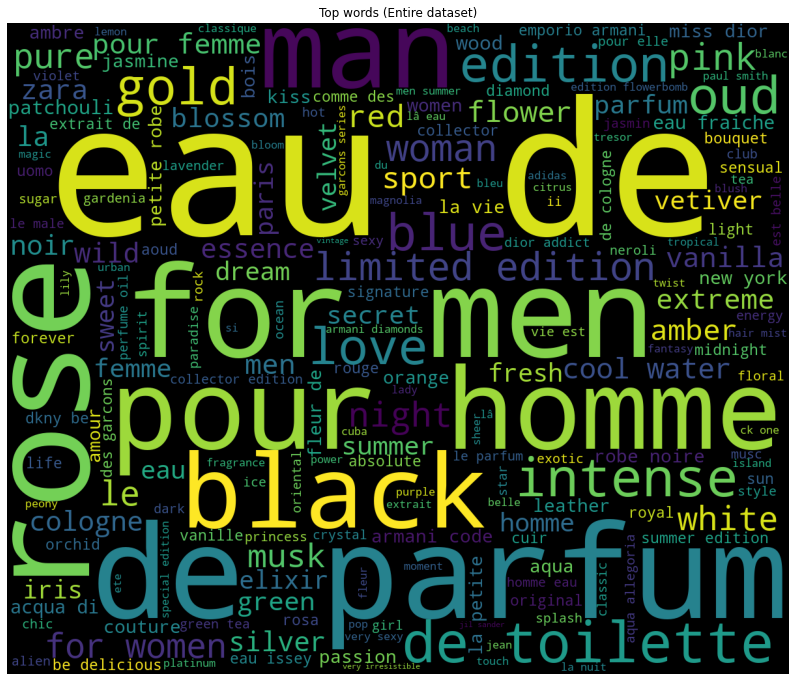

In [63]:
plt.figure(figsize = (14, 14))
text = ' '.join(map(str, names))
wordcloud = WordCloud(max_font_size = None, background_color = 'black', width = 1200, height = 1000).generate(text)
plt.imshow(wordcloud)
plt.title('Top words (Entire dataset)')
plt.axis("off")
plt.show()

In [64]:
sorted_bag = sorted(bag.items(), key = lambda aa: aa[1], reverse=True)
print(sorted_bag[0:30])

[('de', 1822), ('eau', 1521), ('for', 1154), ('edition', 807), ('men', 656), ('parfum', 649), ('homme', 578), ('l', 577), ('pour', 540), ('rose', 519), ('summer', 511), ('d', 469), ('la', 429), ('black', 398), ('the', 382), ('love', 376), ('man', 362), ('women', 302), ('woman', 299), ('intense', 297), ('toilette', 297), ('oud', 283), ('her', 276), ('blue', 269), ('le', 256), ('di', 253), ('in', 249), ('gold', 243), ('of', 243), ('a', 242)]


>**From the top words, we can see that most of them are just the typical filler words and words that describe how powerful the fragrance is such as 'Eau de Toilette' or 'Eau de Parfum' or the intended sex for the fragrance such as 'Homme' or 'Femme'.**

>>**From the wordcloud, it can be seen that words to promote an experience are used as well, including 'be delicious', 'magic', 'limited edition'.**

>>**Interesting find:  I am not too sure why the word 'alien' is one of the top as well but let's not discriminate shall we?**

>**With the top 10th words being 'Rose' with a frequency of 519, it can be deemed that the choice of including the main note/accord in the name is very important as well as found in Section 3.4 Accords, Rose was one of the top notes as well (under flowers)**

---
>**The method so far has included words from the entire dataset. I decided to only include the top 10% fragrances to see if there are any differences**

>**I will also be trying an alternative approach with the bag of words method by find 2-grams. To put in simple words, this method will employ a similar approach to the method above but instead of analysing words on their own, words are analysed in pairs.**

In [65]:
top2500_BoW = BoW.copy()

In [66]:
top2500_BoW = top2500_BoW.sort_values(by=['HHWS'], ascending=False)
top2500_BoW = top2500_BoW.head(2500)
top2500_BoW.reset_index(drop=True, inplace=True)

In [67]:
top2500_names = top2500_BoW['Name']

for each_string in range(len(top2500_names)): 
    tmp = top2500_names[each_string].lower() 
    tmp = re.sub(r'\W', ' ', tmp) 
    top2500_names[each_string] = re.sub(r'\s+', ' ', tmp) 
    
top_bag = {}
for each_name in top2500_names: 
    temp_names = nltk.word_tokenize(each_name) 
    for name in temp_names: 
        if name in top_bag.keys(): 
            top_bag[name] += 1
        else: 
            top_bag[name] = 1

c:\users\alloy\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



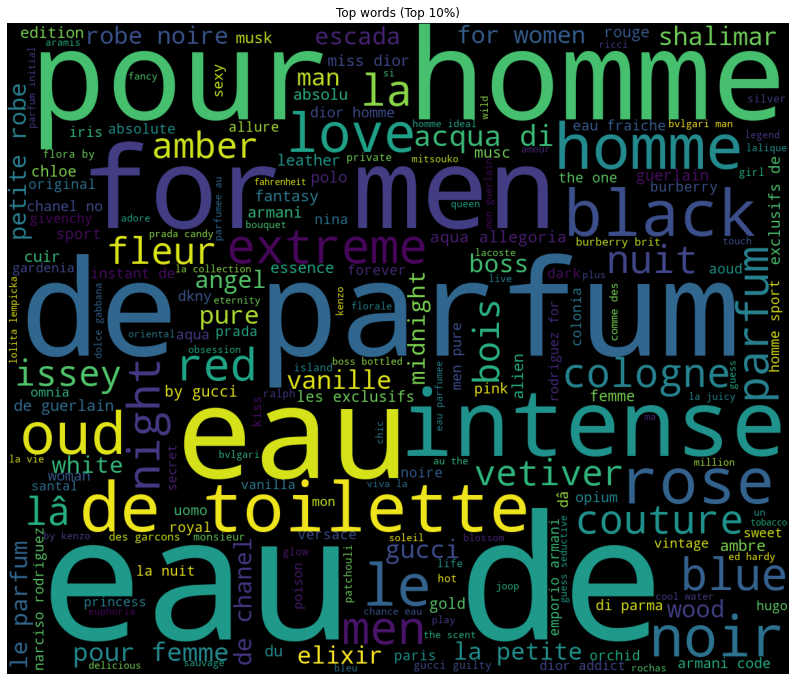

In [68]:
plt.figure(figsize = (14, 14))
text = ' '.join(map(str, top2500_names))
wordcloud = WordCloud(max_font_size = None, background_color = 'black', width = 1200, height = 1000).generate(text)
plt.imshow(wordcloud)
plt.title('Top words (Top 10%)')
plt.axis("off")
plt.show()

In [69]:
sorted_top_bag = sorted(top_bag.items(), key = lambda aa: aa[1], reverse=True)
print(sorted_top_bag[0:30])

[('de', 263), ('eau', 259), ('homme', 143), ('l', 123), ('parfum', 121), ('for', 118), ('pour', 102), ('men', 92), ('la', 71), ('d', 69), ('intense', 56), ('toilette', 51), ('black', 49), ('the', 47), ('le', 42), ('by', 40), ('rose', 39), ('noir', 38), ('oud', 37), ('a', 36), ('gucci', 34), ('dior', 33), ('di', 31), ('armani', 31), ('in', 31), ('love', 31), ('guerlain', 30), ('chanel', 28), ('her', 28), ('femme', 28)]


>**The top few words do not have any difference but along the rankings, 'Rose' appears as the top 17th word and designer names started appearing as well. As mentioned earlier, fragrances are designer goods after all and biases tend to exist.**

>**From the wordcloud, most of the words are also either describing the intended sex, power of the fragrance or designers names as well.**

In [70]:
top_bigrams = {}
for each_name in top2500_names: 
#     temp_names = nltk.bigrams(each_name) 
    temp_names = list(nltk.bigrams(each_name.split()))
    for name in temp_names: 
        if name in top_bigrams.keys(): 
            top_bigrams[name] += 1
        else: 
            top_bigrams[name] = 1
            
sorted_top_bigram = sorted(top_bigrams.items(), key = lambda aa: aa[1], reverse=True)
print(sorted_top_bigram[0:30])

[(('eau', 'de'), 156), (('de', 'parfum'), 85), (('pour', 'homme'), 72), (('for', 'men'), 60), (('de', 'toilette'), 51), (('l', 'eau'), 40), (('for', 'her'), 24), (('l', 'homme'), 22), (('acqua', 'di'), 17), (('pour', 'femme'), 17), (('de', 'chanel'), 14), (('for', 'women'), 14), (('l', 'instant'), 14), (('la', 'petite'), 14), (('petite', 'robe'), 14), (('robe', 'noire'), 14), (('d', 'issey'), 13), (('a', 'men'), 13), (('le', 'parfum'), 13), (('aqua', 'allegoria'), 13), (('eau', 'd'), 12), (('miss', 'dior'), 12), (('de', 'guerlain'), 12), (('for', 'him'), 12), (('les', 'exclusifs'), 11), (('exclusifs', 'de'), 11), (('by', 'gucci'), 11), (('dior', 'homme'), 10), (('eau', 'fraiche'), 10), (('armani', 'code'), 10)]


>**This time round with the 2-gram method, designer names start appearing higher up in the rankings.**

**Thank you very much for taking a look through my kernel. It was a very interesting project as I wanted to share the findings and hobby of mine with as many people as I can. If you have any feedback or wish to collaborate on a project, you may reach out to me at atan091@e.ntu.edu.sg!**